In [1]:
import keras

import numpy as np
import tensorflow as tf
print(f"tensorflow version: {tf.__version__}")
from tensorflow.keras.models import Model
import os
import cv2

tensorflow version: 2.10.0


In [2]:
# Directory containing the combined images
dataset_dir = "dataset/train"

# List all image files in the directory
image_files = [file for file in os.listdir(dataset_dir) if file.endswith(".jpg")]



# Create empty lists to store input and target images
input_images = []
target_images = []

# Load and preprocess the images
for file in image_files:
    image_path = os.path.join(dataset_dir, file)
    image = cv2.imread(image_path)
    input_image = (tf.image.resize(image[:, :600, :], [256, 256])) 
    target_image = (tf.image.resize(image[:, 600:, :], [256, 256]))
    input_image = (input_image - 127.5) / 127.5
    target_image = (target_image - 127.5) / 127.5
    input_images.append(input_image)
    target_images.append(target_image)

input_images = np.array(input_images)
target_images = np.array(target_images)

# Create TensorFlow dataset
train_dataset = tf.data.Dataset.from_tensor_slices((input_images, target_images))

# Shuffle and batch the dataset
train_dataset = train_dataset.shuffle(buffer_size=1096).batch(1)

# Print the number of samples in the training dataset
print("Number of samples in the training dataset:", len(train_dataset))

Number of samples in the training dataset: 1096


In [3]:
# Print shape information
print("Shape of input images:", input_images.shape)
print("Shape of target images:", target_images.shape)


Shape of input images: (1096, 256, 256, 3)
Shape of target images: (1096, 256, 256, 3)


In [4]:
output_dir = "generated_images_final_epoch"
os.makedirs(output_dir, exist_ok=True)

In [6]:
# Load the saved generator model
generator = tf.keras.models.load_model("generator")


In [9]:
from PIL import Image
# Save all generated images
for idx, (input_image, _) in enumerate(train_dataset):
    

    # Generate an output image using the generator
    generated_image = generator(input_image, training=False)

    # Rescale the pixel values from [-1, 1] to [0, 255]
    generated_image = (generated_image[0] * 0.5 + 0.5) * 255.0

    # Convert the generated image to uint8 data type
    generated_image = tf.cast(generated_image, tf.uint8)

    # Create a PIL Image object from the generated image
    generated_pil_image = Image.fromarray(generated_image.numpy())

    # Save the generated image
    generated_path = os.path.join(output_dir, f"generated_image_{idx + 1}.jpg")
    generated_pil_image.save(generated_path)

In [11]:
import matplotlib.pyplot as plt

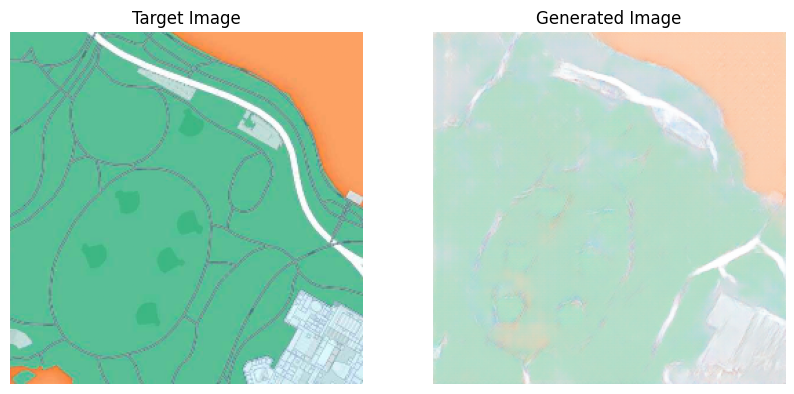

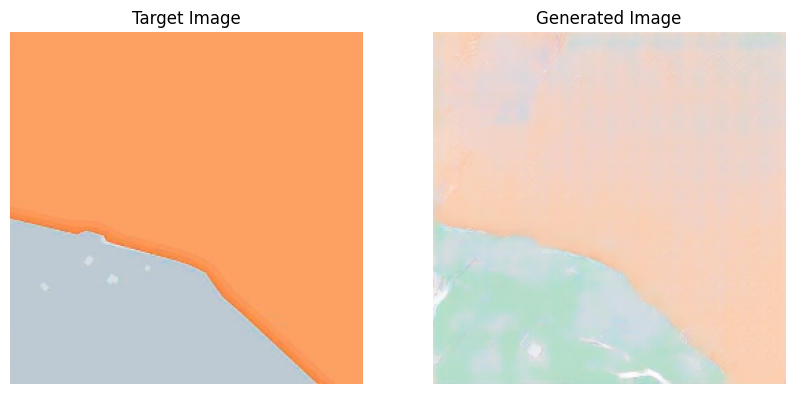

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


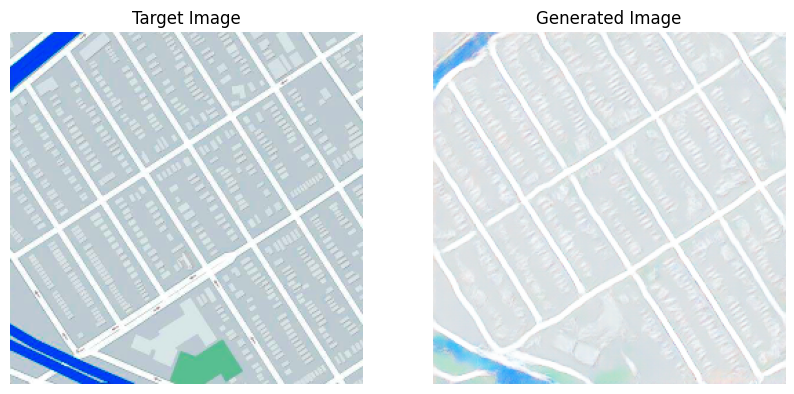

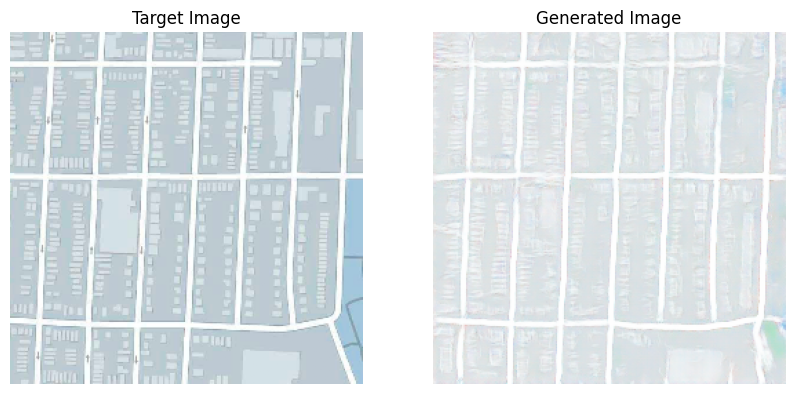

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


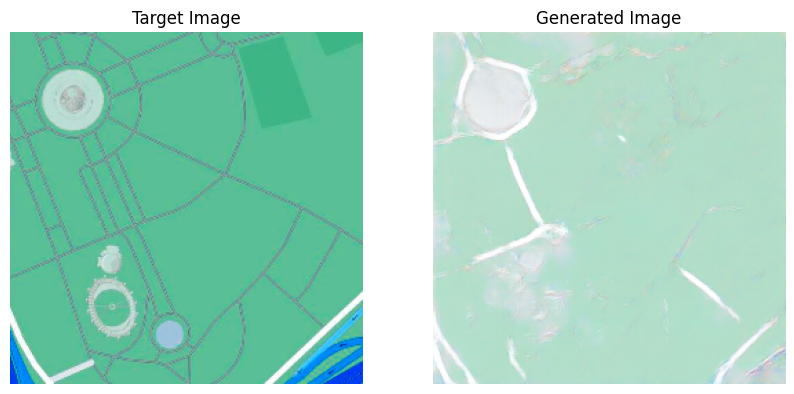

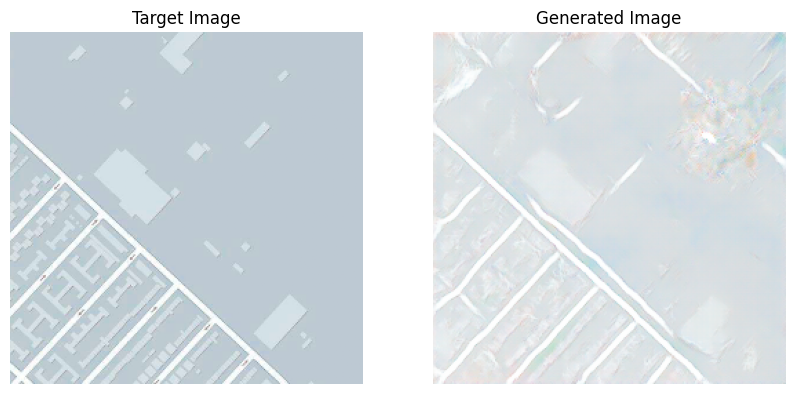

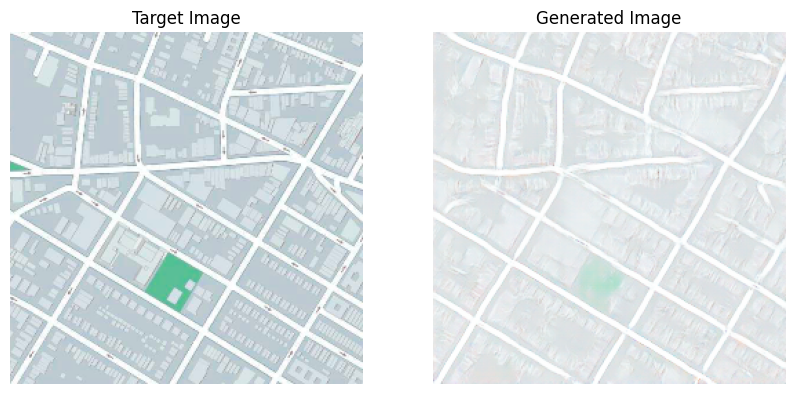

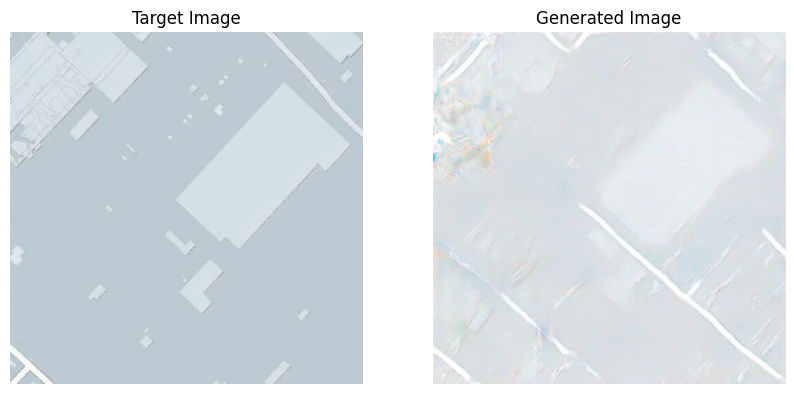

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


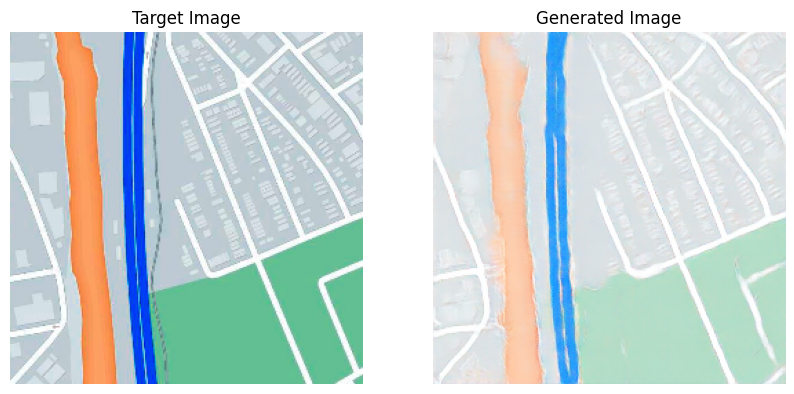

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


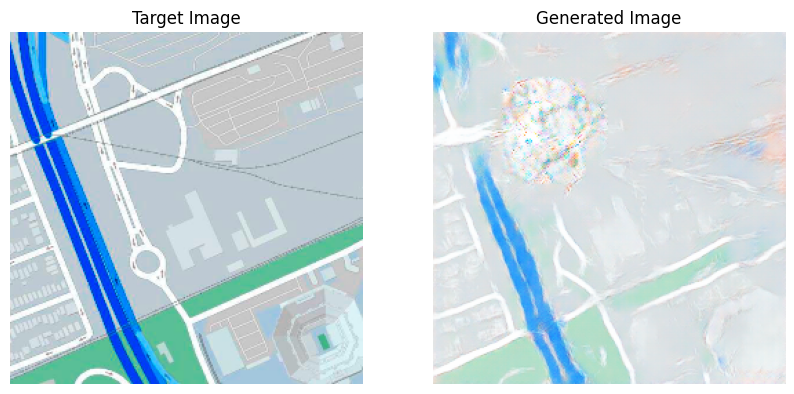

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


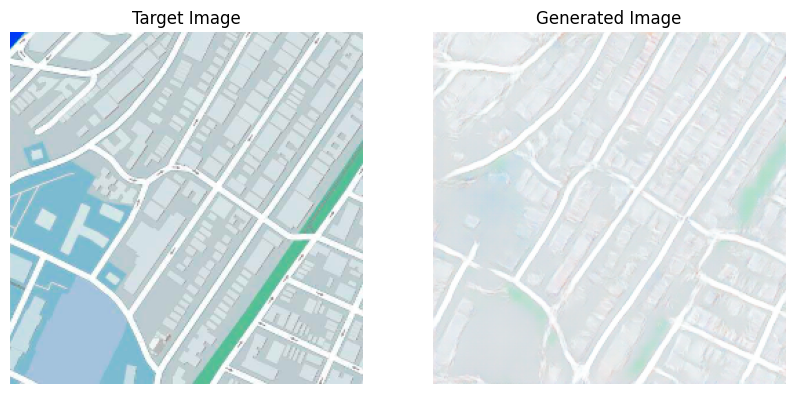

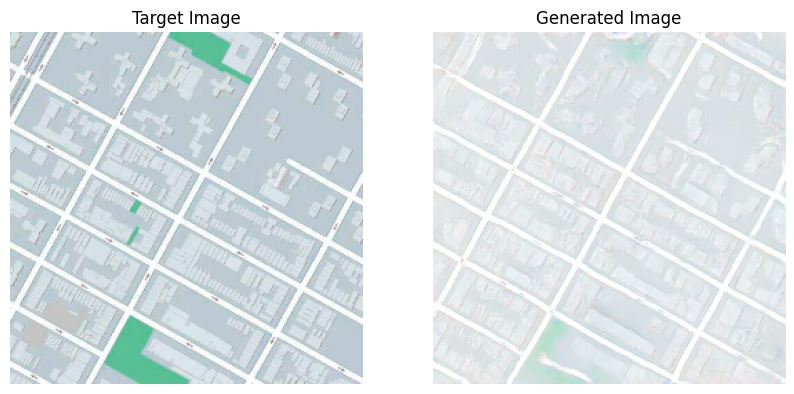

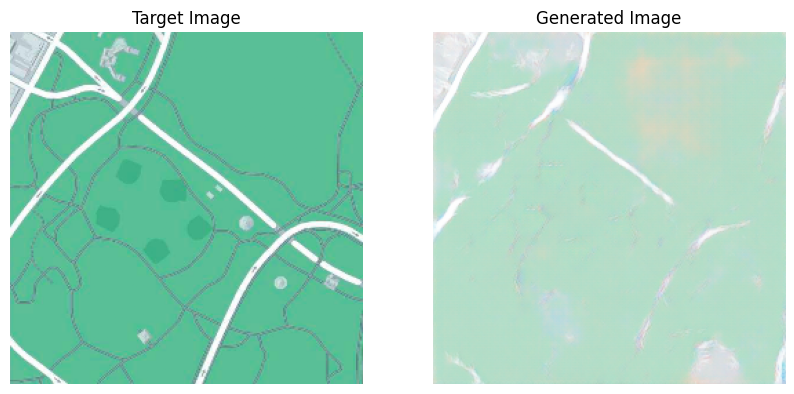

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


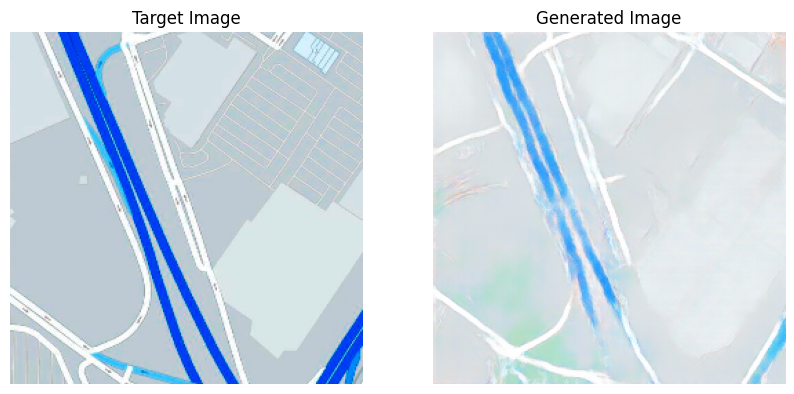

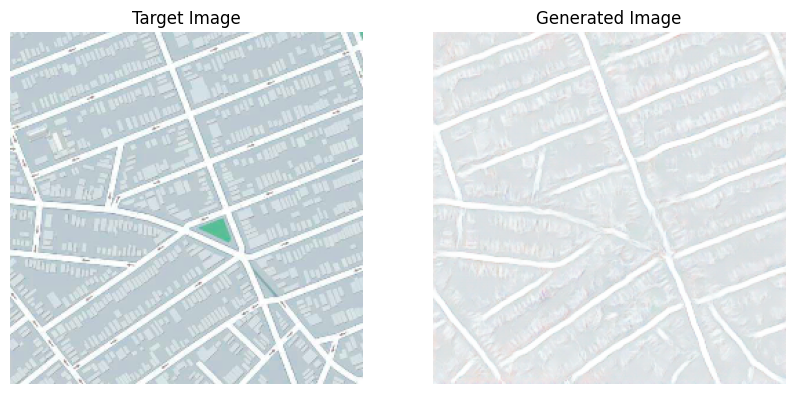

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


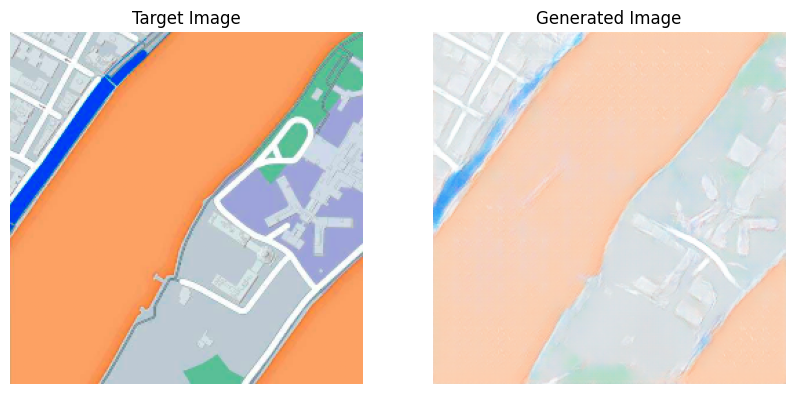

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


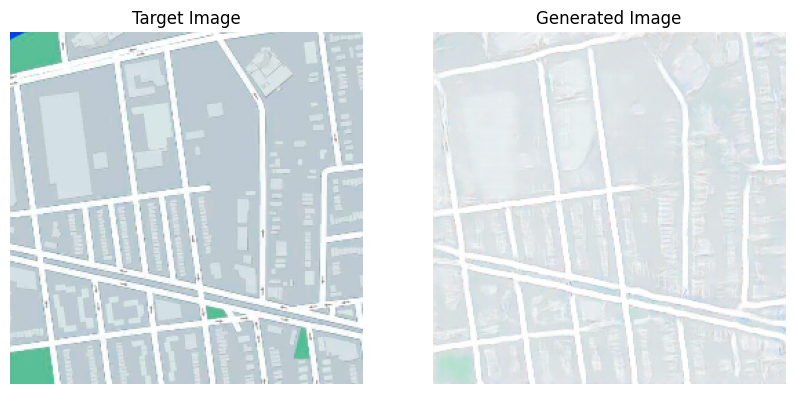

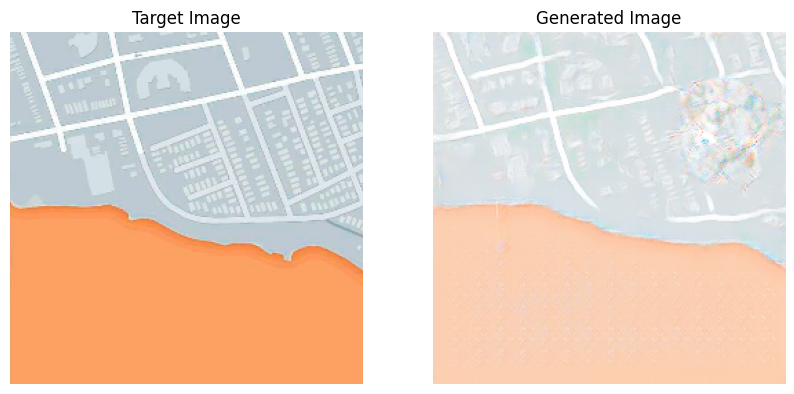

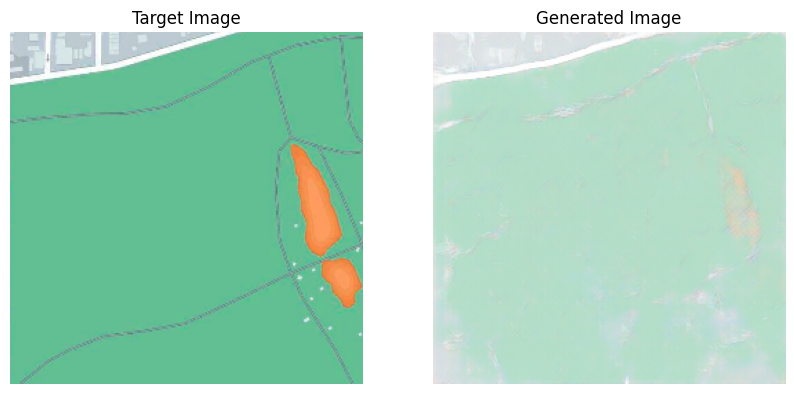

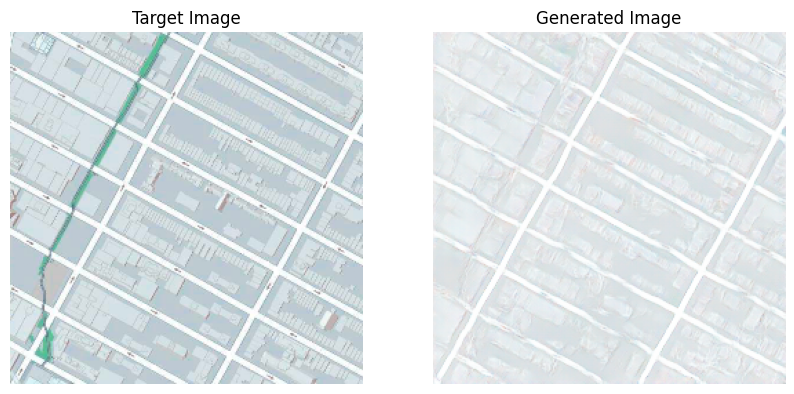

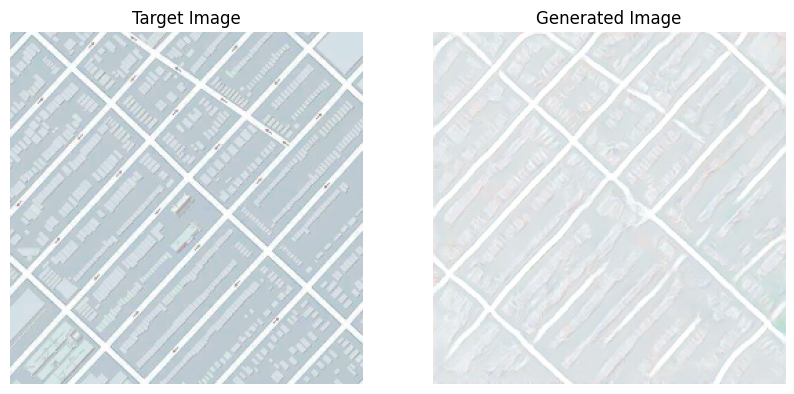

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


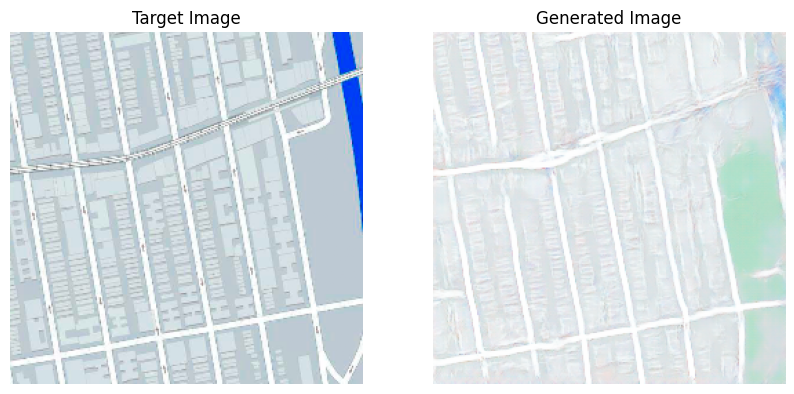

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


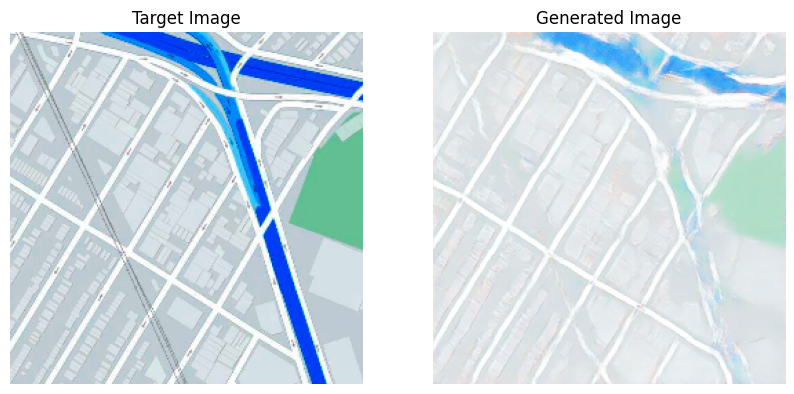

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


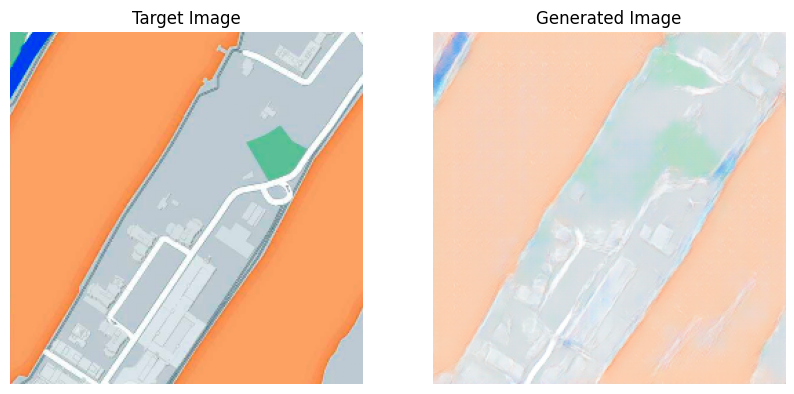

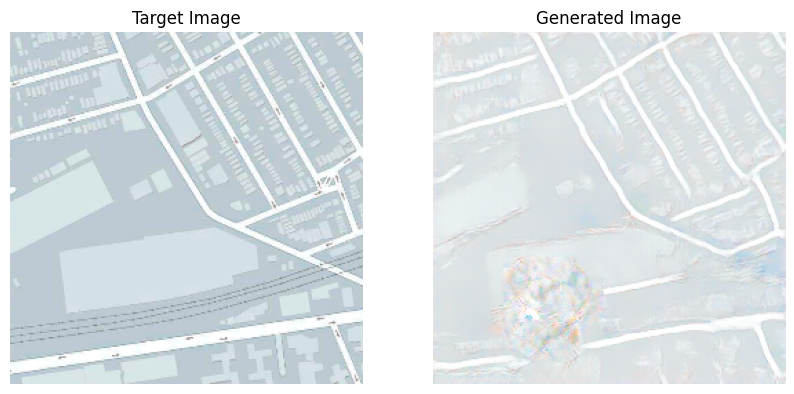

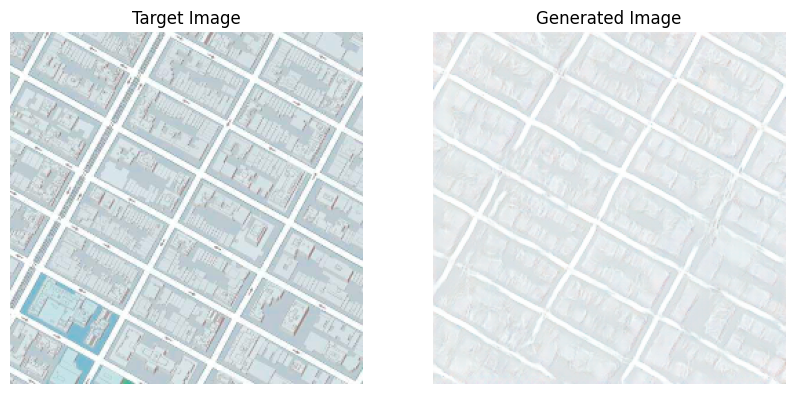

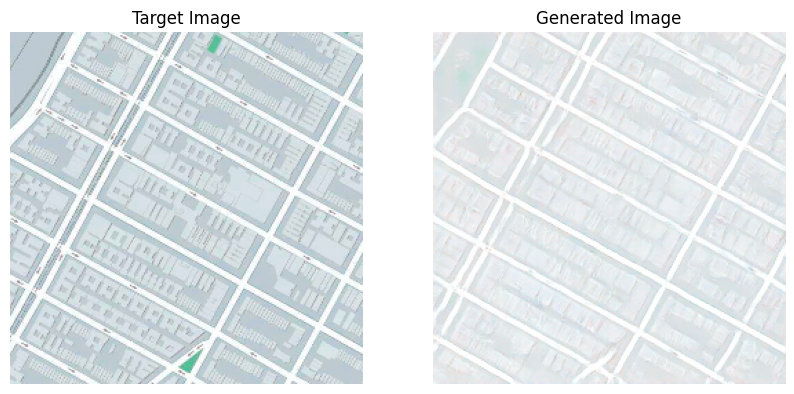

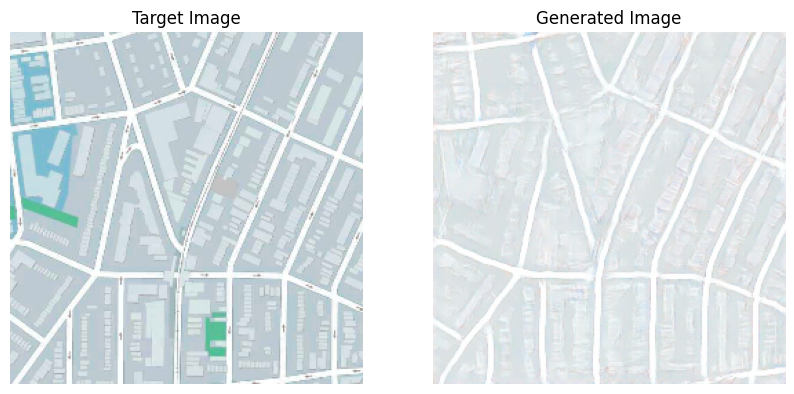

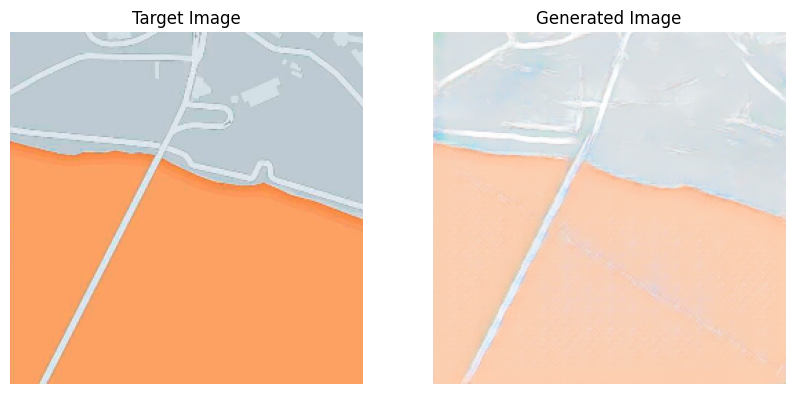

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


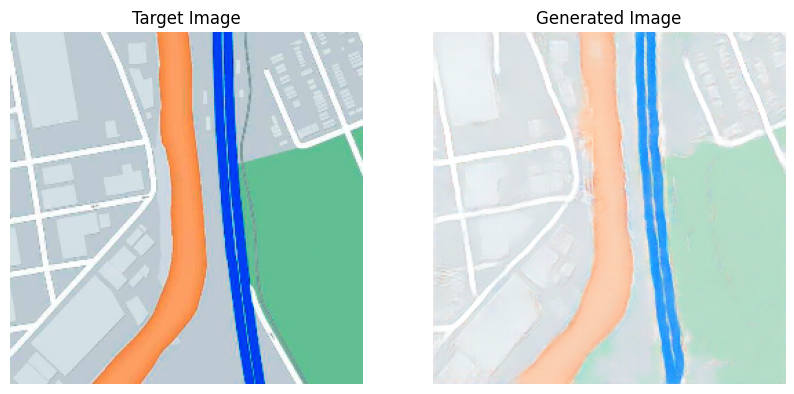

In [ ]:
# Select a few random images from the dataset
num_images_to_plot = 200
selected_indices = np.random.choice(len(input_images), num_images_to_plot, replace=False)

# Plot the selected target and generated images
for idx in selected_indices:
    input_image = input_images[idx]
    target_image = target_images[idx]

    # Generate an output image using the generator
    generated_image = generator(np.expand_dims(input_image, axis=0), training=False)

    # Rescale the pixel values from [-1, 1] to [0, 255]
    generated_image = (generated_image[0] * 0.5 + 0.5) * 255.0

    # Convert the generated image to uint8 data type
    generated_image = tf.cast(generated_image, tf.uint8)

    # Plot the target and generated images side by side
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(target_image)
    axs[0].set_title("Target Image")
    axs[0].axis("off")
    axs[1].imshow(generated_image)
    axs[1].set_title("Generated Image")
    axs[1].axis("off")
    plt.show()